# Predicting Cell Behavior from Cell Morphology During Cell-Cell Shear
__Visualizating the Raw and Labeled Data__

__Authors:__ Lauren Washington, Amil Khan, Alice Mo, Sam Feinstein

---

## Install and Import Packages
If you run into any issues involving `ModuleNotFoundError: No module named 'tensorflow'`, then run the first cell below. Otherwise, run the second one and you should be good to go!

In [146]:
%%bash
# conda install scikit-image pandas matplotlib
# conda install -y "jupyterlab>=3" "ipywidgets>=7.6"
# conda install -c conda-forge -c plotly jupyter-dash
# pip install geomstats
# conda install -c conda-forge opencv

In [151]:
import numpy as np
import skimage
import pandas as pd
import matplotlib.pyplot as plt
import cv2

import geomstats.backend as gs
import geomstats.visualization as visualization
from geomstats.geometry.hypersphere import Hypersphere
from geomstats.geometry.special_orthogonal import SpecialOrthogonal

plt.rcParams["figure.dpi"] = 300
%config InlineBackend.figure_format='retina'

---

## Load Data


In [186]:
img   = skimage.io.imread("OG/BP-01_img_000000000_TXR_000.tif", as_gray=True)
label = skimage.io.imread("Labels/BP-01_img_000000000_TXR_000_label.png", as_gray=True)
data  = pd.read_csv("Data/BP-01_img_000000000_TXR_000_Erosion_0px_Channel_1.csv")

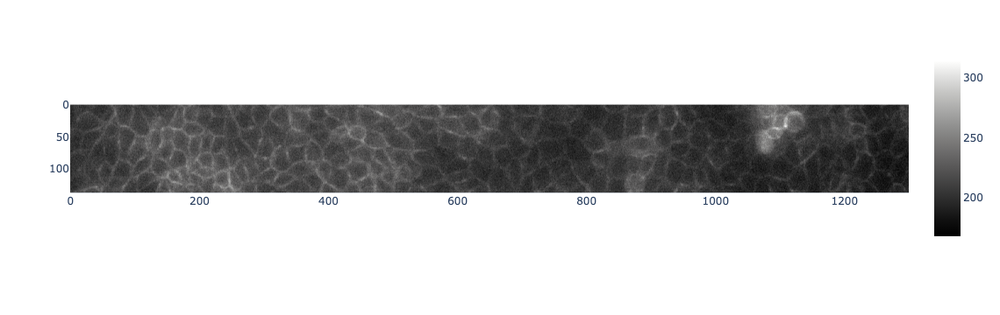

In [50]:
fig = px.imshow(img, color_continuous_scale='gray')
fig.show()

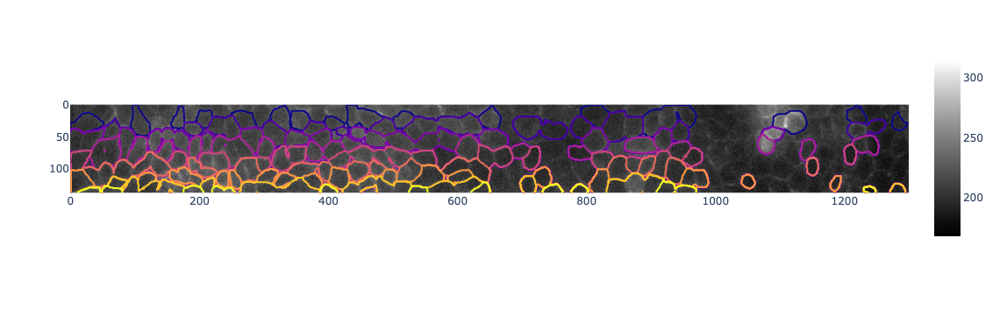

In [46]:
fig = px.imshow(img, color_continuous_scale='gray')
fig.add_trace(go.Contour(z=label, showscale=False,
                         contours=dict( coloring='lines'),
                         line_width=2))
# fig.add_scatter(x=data.X, y=data.Y)
# fig.add_trace(go.Scatter(x=data.X, y=data.Y, marker=dict(color='red', size=16)))
fig.show()

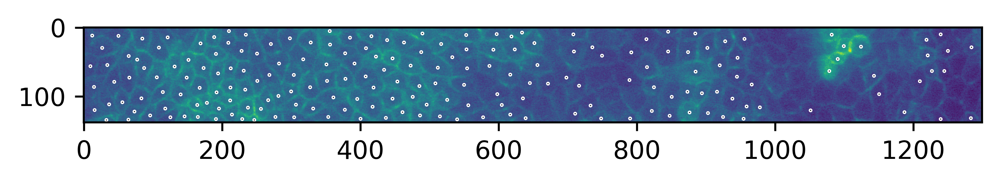

In [187]:
plt.imshow(img)
plt.scatter(data.X, data.Y, c='black', s=0.25, edgecolors='white')


## Visualizing the difference between 1 and 30

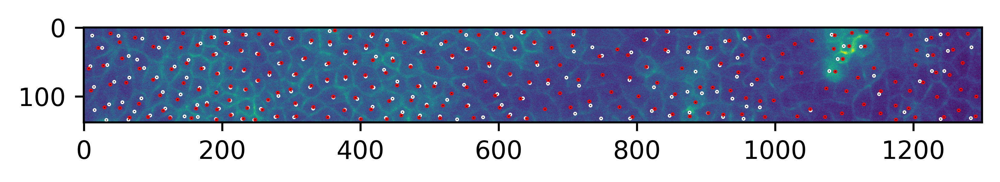

In [92]:
img2   = skimage.io.imread("OG/BP-01_img_000000030_TXR_000.tif")
data2  = pd.read_csv("Data/BP-01_img_000000030_TXR_000_Erosion_0px_Channel_1.csv")
plt.imshow(img2)
plt.scatter(data.X, data.Y, c='black', s=0.25, edgecolors='white')
plt.scatter(data2.X, data2.Y, c='black', s=0.25, edgecolors='red')

The red dots represent the position at (time?) 30. Some have a significant change when comparing from the initial white point. Would it be worth looking at the displacement? What should we look at? The shape of the curves?

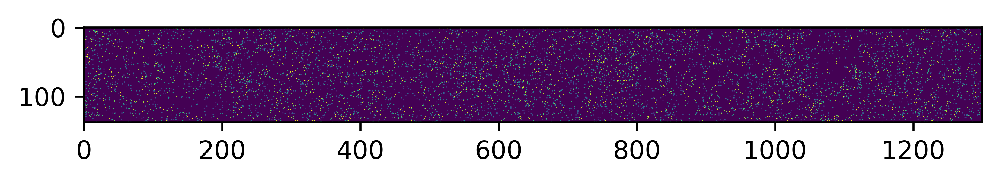

In [84]:
plt.imshow(img == img2)

In [190]:
contours = skimage.measure.find_contours(label, 23)


In [170]:
# Find Canny edges
# gray = cv2.cvtColor(label, cv2.COLOR_BGR2GRAY)
# edged = cv2.Canny(gray, 30, 200)
# cv2.waitKey(0)
  
# Finding Contours
# Use a copy of the image e.g. edged.copy()
# since findContours alters the image
contours, hierarchy = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

error: OpenCV(4.7.0) /io/opencv/modules/imgproc/src/contours.cpp:195: error: (-210:Unsupported format or combination of formats) [Start]FindContours supports only CV_8UC1 images when mode != CV_RETR_FLOODFILL otherwise supports CV_32SC1 images only in function 'cvStartFindContours_Impl'


In [157]:
a = label==23
im2, contours, hierarchy = cv2.findContours(label, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
cim = np.zeros_like(a)
cv2.drawContours(cim, contours, -1, 255, 1)

error: OpenCV(4.7.0) /io/opencv/modules/imgproc/src/contours.cpp:195: error: (-210:Unsupported format or combination of formats) [Start]FindContours supports only CV_8UC1 images when mode != CV_RETR_FLOODFILL otherwise supports CV_32SC1 images only in function 'cvStartFindContours_Impl'


In [106]:
from geomstats.geometry.special_orthogonal import SpecialOrthogonal

from geomstats.geometry.discrete_curves import DiscreteCurves
from geomstats.geometry.euclidean import Euclidean

r2 = Euclidean(2)

planar_curves_space = DiscreteCurves(r2)

result = planar_curves_space.belongs(label)
gs.all(result)

False

In [108]:
import geomstats.datasets.utils as data_utils
cells, cell_lines, treatments = data_utils.load_cells()


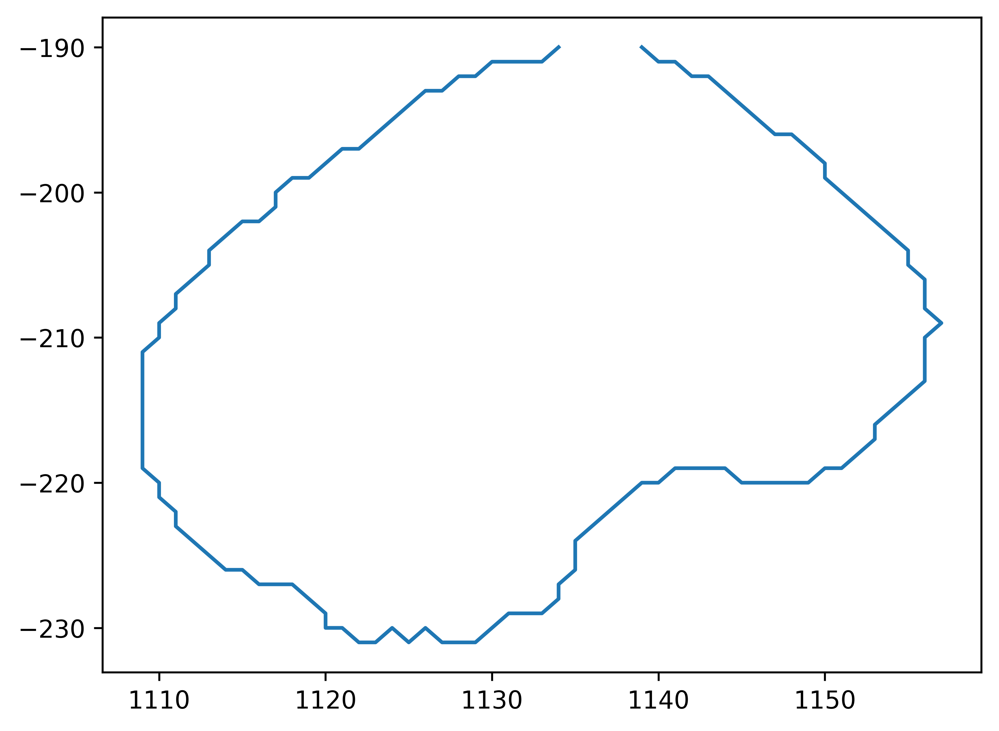

In [116]:
cell_id = 50
cell = cells[cell_id]
plt.plot(cell[:, 0], cell[:, 1])